<a href="https://colab.research.google.com/github/alnibl/Portfolio/blob/main/Colab_GAN_7.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#GAN_7. 256 х 384. 



In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Sun Mar 27 16:16:18 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   35C    P8     9W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
!pip install -U albumentations --no-binary qudida,albumentations
!pip install -U git+https://github.com/albumentations-team/albumentations

In [ ]:
from keras.models import Sequential, Model
from keras.layers import Input, Dense, Reshape, Flatten, Dropout, Concatenate, add
from keras.layers import LeakyReLU, Activation, Conv2DTranspose, BatchNormalization, Add
from keras.layers import UpSampling2D, Conv2D, SeparableConv2D, MaxPooling2D
from tensorflow.keras.optimizers import Adam
from keras.applications import vgg19
from keras.models import load_model
import keras.backend as K

from keras.preprocessing.image import ImageDataGenerator
import numpy as np
from keras.preprocessing.image import img_to_array, load_img
from keras.utils.vis_utils import plot_model
import matplotlib.pyplot as plt
from PIL import Image
import cv2
import albumentations as A

import torch
import torchvision
import torchvision.transforms as transforms
import math
import scipy

import shutil
import sys
import os
from tqdm import tqdm
import random
import time

from tensorflow.python.platform.tf_logging import set_verbosity, FATAL

# отключаем отображение некритических предупреждений
set_verbosity(FATAL)
os.environ["TF_CPP_MIN_LOG_LEVEL"] = '0'

In [ ]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Копирую базу из google drive в colab
shutil.copytree('/content/drive/MyDrive/Базы/Обрезанные/Для аугментации/', '/content/Для аугментации/')
shutil.copytree('/content/drive/MyDrive/Базы/Фон/', '/content/Фон/')

'/content/Фон/'

In [ ]:

# Все пути к файлам
path_car = '/content/Для аугментации/'  # путь к машинам
cr1 = sorted(os.listdir(path_car + 'Audi/'))  # список имен всех файлов в папке
cr2 = sorted(os.listdir(path_car + 'Bmw/'))  # список имен всех файлов в папке
cr3 = sorted(os.listdir(path_car + 'Kia/'))  # список имен всех файлов в папке
cr4 = sorted(os.listdir(path_car + 'Mercedesbenz/'))
cr5 = sorted(os.listdir(path_car + 'Opel/'))
cr6 = sorted(os.listdir(path_car + 'Volkswagen/'))
cr7 = sorted(os.listdir(path_car + 'Volvo/'))
print("По пути {}, файлов: {}".format(path_car, len(cr1 + cr2 + cr3 + cr4 + cr5 + cr6 + cr7)))

path_background = '/content/Фон/'  # путь к фону
back1 = sorted(os.listdir(path_background + 'Дорога, лес/'))  # список имен всех файлов в папке
back2 = sorted(os.listdir(path_background + 'Youtube/'))  # список имен всех файлов в папке
back3 = sorted(os.listdir(path_background + 'deeploc/'))  # список имен всех файлов в папке
back4 = sorted(os.listdir(path_background + 'deeploccross/'))
back5 = sorted(os.listdir(path_background + 'FreiburgStreetCrossing/'))
back6 = sorted(os.listdir(path_background + 'frida2/'))
print("По пути {}, файлов: {}".format(path_background, len(back1 + back2 + back3 + back4 + back5 + back6)))
ln = len(back1 + back2 + back3 + back4 + back5 + back6)  # количество фото фонов - для прогрессбара
ln

По пути /content/Для аугментации/, файлов: 2360
По пути /content/Фон/, файлов: 2528


2528

In [ ]:
# функция просмотра размеров изображений в папках

def height_width_img(way):  # На вход подаем путь к изображениям
    fl = sorted(os.listdir(way))  # Получаю список файлов в папке
    w = []
    h = []
    for i in range(len(fl)):  # Прохожусь по каждому файлу в папке
        img = image.load_img(way + fl[i])  # Открываю изображение
        w.append(img.size[0])
        h.append(img.size[1])

    print('Уникальных значений ширины:', set(w))
    print('Уникальных значений высоты:', set(h))
    print('Max. width image: {}, Min. width image: {}, Max. height image: {},'
          ' Min. height image: {}'.format(max(w),
                                          min(w),
                                          max(h),
                                          min(h)))

In [ ]:
way = path_car + 'Audi/'
height_width_img(way)

Уникальных значений ширины: {800}
Уникальных значений высоты: {600, 394, 491, 500}
Max. width image: 800, Min. width image: 800, Max. height image: 600, Min. height image: 394


In [ ]:
way = path_car + 'Bmw/'
height_width_img(way)

Уникальных значений ширины: {800}
Уникальных значений высоты: {600}
Max. width image: 800, Min. width image: 800, Max. height image: 600, Min. height image: 600


In [ ]:
way = path_car + 'Kia/'
height_width_img(way)

Уникальных значений ширины: {800}
Уникальных значений высоты: {600, 533}
Max. width image: 800, Min. width image: 800, Max. height image: 600, Min. height image: 533


In [ ]:
way = path_car + 'Mercedesbenz/'
height_width_img(way)

Уникальных значений ширины: {800}
Уникальных значений высоты: {600, 533, 542}
Max. width image: 800, Min. width image: 800, Max. height image: 600, Min. height image: 533


In [ ]:
way = path_car + 'Opel/'
height_width_img(way)

Уникальных значений ширины: {800}
Уникальных значений высоты: {450, 517, 359, 496, 533, 600, 473}
Max. width image: 800, Min. width image: 800, Max. height image: 600, Min. height image: 359


In [ ]:
way = path_car + 'Volkswagen/'
height_width_img(way)

Уникальных значений ширины: {800}
Уникальных значений высоты: {600, 533}
Max. width image: 800, Min. width image: 800, Max. height image: 600, Min. height image: 533


In [ ]:
way = path_car + 'Volvo/'
height_width_img(way)

Уникальных значений ширины: {800}
Уникальных значений высоты: {600}
Max. width image: 800, Min. width image: 800, Max. height image: 600, Min. height image: 600


In [ ]:
way = path_background + 'Дорога, лес/'
height_width_img(way)

Уникальных значений ширины: {576}
Уникальных значений высоты: {352}
Max. width image: 576, Min. width image: 576, Max. height image: 352, Min. height image: 352


In [ ]:
way = path_background + 'Youtube/'
height_width_img(way)

Уникальных значений ширины: {1280, 576}
Уникальных значений высоты: {720, 676, 352}
Max. width image: 1280, Min. width image: 576, Max. height image: 720, Min. height image: 352


In [ ]:
way = path_background + 'deeploc/'
height_width_img(way)

Уникальных значений ширины: {1280}
Уникальных значений высоты: {720}
Max. width image: 1280, Min. width image: 1280, Max. height image: 720, Min. height image: 720


In [ ]:
way = path_background + 'deeploccross/'
height_width_img(way)

Уникальных значений ширины: {1280}
Уникальных значений высоты: {720}
Max. width image: 1280, Min. width image: 1280, Max. height image: 720, Min. height image: 720


In [ ]:
way = path_background + 'FreiburgStreetCrossing/'
height_width_img(way)

Уникальных значений ширины: {1024}
Уникальных значений высоты: {768}
Max. width image: 1024, Min. width image: 1024, Max. height image: 768, Min. height image: 768


In [ ]:
way = path_background + 'frida2/'
height_width_img(way)

Уникальных значений ширины: {640}
Уникальных значений высоты: {480}
Max. width image: 640, Min. width image: 640, Max. height image: 480, Min. height image: 480


In [ ]:
# Генератор для машин
batch_size = 8  # Размер выборки
# Генератор изображений
car_datagen = ImageDataGenerator(
    # rescale=1. / 255, #Значения цвета меняем на дробные показания
    rotation_range=10,  # Поворачиваем изображения при генерации выборки
    width_shift_range=0.1,  # Двигаем изображения по ширине при генерации выборки
    height_shift_range=0.1,  # Двигаем изображения по высоте при генерации выборки
    zoom_range=0.1,  # Зумируем изображения при генерации выборки
    horizontal_flip=True,  # Включаем отзеркаливание изображений
    fill_mode='nearest',  # Заполнение пикселей вне границ ввода
    # validation_split=0.1, #Указываем разделение изображений на обучающую и тестовую выборку
)

In [ ]:
car_generator = car_datagen.flow_from_directory(
    path_car,  # Путь ко всей выборке
    target_size=(359, 478),  # Размер изображений (первоначальный 1280 на 720)
    batch_size=batch_size,  # Размер batch_size
    class_mode=None,
    shuffle=True,  # Перемешивание выборки
    # subset='training', # устанавливаем как набор для обучения
    color_mode="rgba",
    save_format="png",
    # save_to_dir= '/content/generator'
)

Found 2360 images belonging to 7 classes.


In [ ]:
print(car_generator.samples % batch_size)  # проверяю чтобы делилось на цело
print(car_generator.samples // batch_size)  # количество альтераций с batch_size

0
295


In [ ]:
# Генератор для фона
batch_size = 8  # Размер выборки
# Генератор изображений
background_datagen = ImageDataGenerator(
    # rescale=1. / 255, #Значения цвета меняем на дробные показания
    # rotation_range=5, #Поворачиваем изображения при генерации выборки
    # width_shift_range=0.1, #Двигаем изображения по ширине при генерации выборки
    # height_shift_range=0.1, #Двигаем изображения по высоте при генерации выборки
    # zoom_range=0.1, #Зумируем изображения при генерации выборки
    horizontal_flip=True,  # Включаем отзеркаливание изображений
    fill_mode='nearest',  # Заполнение пикселей вне границ ввода
    # validation_split=0.1, #Указываем разделение изображений на обучающую и тестовую выборку
)

In [ ]:
# target_size=(352, 576),  #Размер изображений
background_generator = background_datagen.flow_from_directory(
    path_background,  # Путь ко всей выборке
    target_size=(352, 576),  # Размер изображений
    batch_size=batch_size,  # Размер batch_size
    class_mode=None,
    shuffle=True,  # Перемешивание выборки
    # subset='training', # устанавливаем как набор для обучения
    # color_mode="rgb",
    # save_format="jpg",
    # save_to_dir= '/content/generator'
)

Found 2528 images belonging to 6 classes.


In [ ]:
print(background_generator.samples % batch_size)  # нужно чтобы делилось без остатка
print(background_generator.samples // batch_size)  # количество альтераций с batch_size

0
316


In [ ]:
# Albumentations
trf1 = A.ReplayCompose([A.RandomRain(brightness_coefficient=0.9, drop_width=1,
                                     drop_length=12, blur_value=3, p=0.8),
                        A.RGBShift(p=0.3)])  # дождь

# trf2 = A.ReplayCompose([A.RandomSnow(brightness_coeff=2.5, snow_point_lower=0.3, snow_point_upper=0.5, p=0.8),
#                   A.RGBShift(p=0.3)]) #снег

trf3 = A.ReplayCompose([A.RandomSunFlare(flare_roi=(0, 0, 1, 0.5), src_radius=170,
                                         angle_lower=0.5, p=0.8),
                        A.RGBShift(p=0.3)])  # солнце

trf4 = A.ReplayCompose(
    [A.RandomShadow(num_shadows_lower=1, num_shadows_upper=2, shadow_dimension=4,
                    shadow_roi=(0, 0.5, 1, 1), p=0.8),
     A.RGBShift(p=0.3)])  # тень

trf5 = A.ReplayCompose([A.RandomFog(fog_coef_lower=0.4, fog_coef_upper=0.5,
                                    alpha_coef=0.1, p=0.8),
                        A.RGBShift(p=0.3)])  # туман

# Albumentations отдельно для фона
trf_back = A.Compose([A.Resize(256, 384, p=0.5),
                      A.RandomCrop(256, 384, always_apply=True)])  # изменяю размер изображения на 256 на 384

tf = [trf1, trf3, trf4, trf5]

/usr/local/lib/python3.7/dist-packages/albumentations/core/transforms_interface.py:93: UserWarning: RandomShadow could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  self.get_class_fullname() + " could work incorrectly in ReplayMode for other input data"
/usr/local/lib/python3.7/dist-packages/albumentations/core/transforms_interface.py:93: UserWarning: RandomFog could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  self.get_class_fullname() + " could work incorrectly in ReplayMode for other input data"
/usr/local/lib/python3.7/dist-packages/albumentations/core/transforms_interface.py:93: UserWarning: RandomRain could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  self.get_class_fullname() + " could work incorrectly in ReplayMode for other input data"
/usr/local/lib/python3.7/dist-packages/albumentations/core/transforms_interface.py:93: UserWarning: Ra

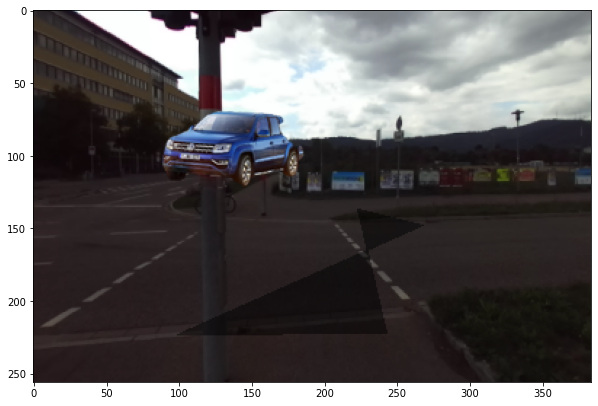

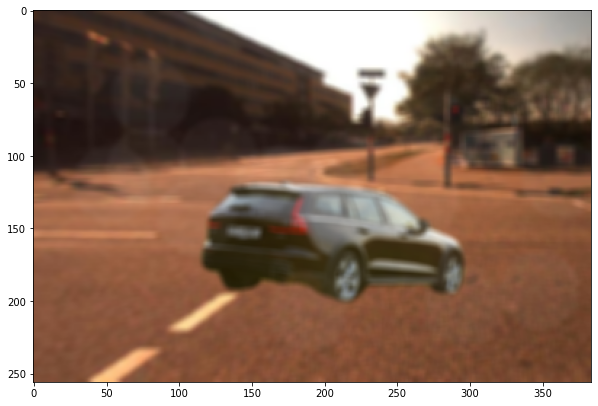

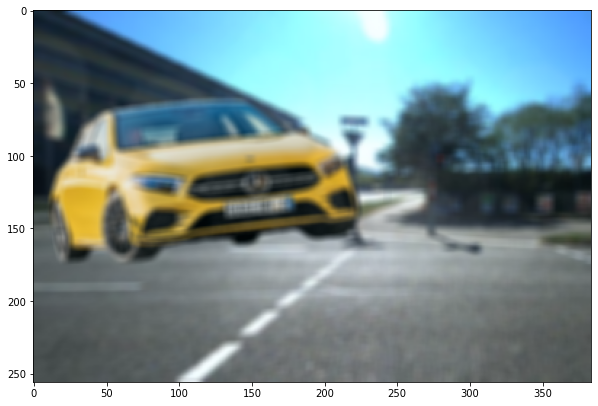

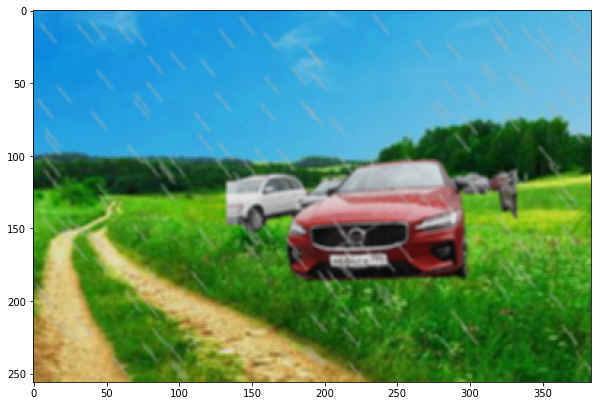

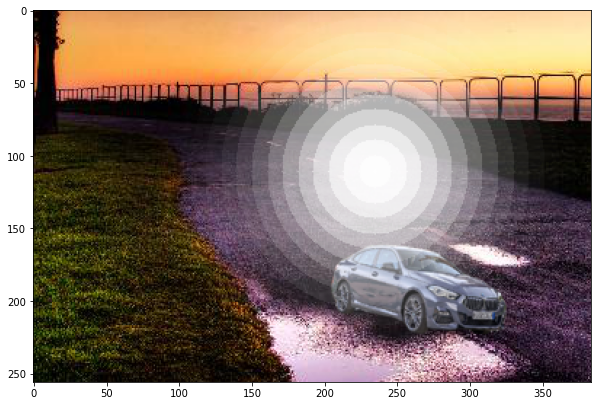

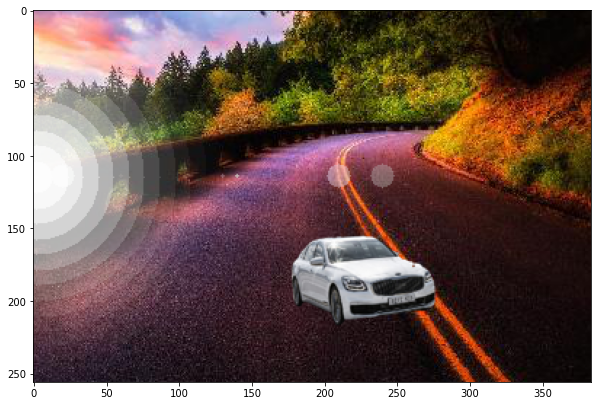

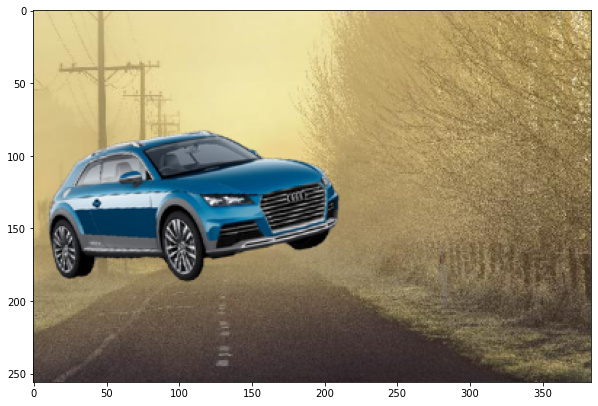

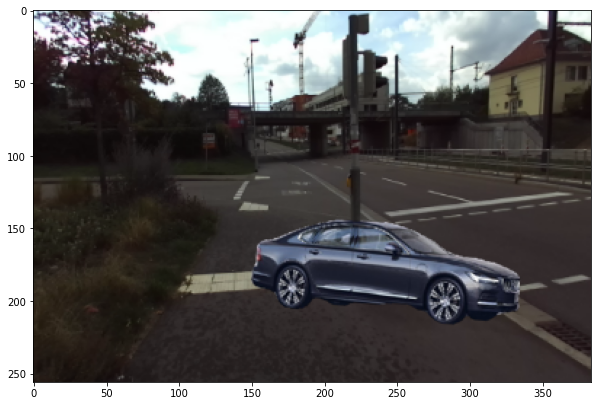

In [ ]:

img_width = 384
img_height = 256
batch_size = 8

rcs = [(80, 60), (120, 90), (160, 120), (200, 150), (240, 180),
       (280, 210)]  # Размеры машины, которую буду налаживать на фон

gen_aug = car_generator.next()  # запускаю генератор изображений авто
back_aug = background_generator.next()  # запускаю генератор изображений фона

for i in range(batch_size):
    car = gen_aug[i]  # Беру картинку авто из генератора
    car = car.astype('uint8')  # Меняем тип на однобайтовый без знака
    car = Image.fromarray(car)  # Переводим массив в изображение
    car = car.convert('RGBA')  # Конвертирую в RGBA
    car_size = random.choice(rcs)  # Случайно выбираю размер resize, который буду применять к изображению машины
    car = car.resize(car_size)  # Меняю размер изображения с машиной по выбранным параметрам car_size

    background = back_aug[i]  # Беру картинку фона из генератора
    background_np = background.astype('uint8')  # Меняем тип на однобайтовый без знака
    background_tfr = trf_back(image=background_np)  # Применяю Albumentations 1
    background_tfr_1 = background_tfr['image']

    tfr = random.choice(tf)  # Выбираю дополнительную Albumentations
    background_2_np = tfr(image=background_tfr_1)  # Применяю Albumentations 2
    background_2 = background_2_np['image']  # Это Будущий y_train

    x = random.randint(0, img_width - car_size[
        0])  # координаты расположения авто на фоне, по оси х. Случайное число от 0 до 384 - car_size[1]
    y = random.randint(0, img_height - car_size[
        1])  # координаты расположения авто на фоне, по оси y. Случайное число от 0 до 256 - car_size[0]
    background_result = Image.fromarray(background_tfr_1).convert('RGB')
    background_result.paste(car, (x, y), car)  # налаживаю машину на фон, координаты x и y
    background_result = np.array(background_result)

    image_result_tfr = A.ReplayCompose.replay(background_2_np['replay'], image=background_result)
    image_result = image_result_tfr['image']

    plt.figure(figsize=(10, 15))
    plt.imshow(image_result)
    plt.show
    # del car
    # del background_tfr
    # del background_2_np
    # del background_result
    # del image_result_tfr
    # del image_result

In [ ]:
def image_paste_x_train():
    x_tr = []
    y_tr = []

    rcs = [(80, 60), (120, 90), (160, 120), (200, 150), (240, 180),
           (280, 210)]  # Размеры фото авто, которую буду налаживать на фон

    gen_aug = car_generator.next()  # запускаю генератор изображений авто
    back_aug = background_generator.next()  # запускаю генератор изображений фона

    for i in range(batch_size):
        car = gen_aug[i]  # Беру картинку авто из генератора
        car = car.astype('uint8')  # Меняем тип на однобайтовый без знака
        car = Image.fromarray(car)  # Переводим массив в изображение
        car = car.convert('RGBA')  # Конвертирую в RGBA
        car_size = random.choice(rcs)  # Случайно выбираю размер resize, который буду применять к изображению машины
        car = car.resize(car_size)  # Меняю размер изображения с машиной по выбранным параметрам car_size

        background = back_aug[i]  # Беру картинку фона из генератора
        background_np = background.astype('uint8')  # Меняем тип на однобайтовый без знака
        background_tfr = trf_back(image=background_np)['image']  # Применяю Albumentations 1

        tfr = random.choice(tf)  # Выбираю дополнительную Albumentations
        background_2_np = tfr(image=background_tfr)  # Применяю Albumentations 2
        background_2 = background_2_np['image']  # Это Будущий y_train

        x = random.randint(0, img_width - car_size[
            0])  # координаты расположения авто на фоне, по оси х. Случайное число от 0 до 384 - car_size[1]
        y = random.randint(0, img_height - car_size[
            1])  # координаты расположения авто на фоне, по оси y. Случайное число от 0 до 256 - car_size[0]
        background_result = Image.fromarray(background_tfr).convert('RGB')
        background_result.paste(car, (x, y), car)  # налаживаю машину на фон, координаты x и y
        background_result = np.array(background_result)

        image_result_ = A.ReplayCompose.replay(background_2_np['replay'], image=background_result)
        image_result = image_result_['image']

        x_tr.append(image_result)  # Добавляем очередной элемент в xTrain
        y_tr.append(background_2)  # Добавляем очередной элемент в yTrain

    x_tr = np.array(x_tr)  # Перевожу в numpy
    y_tr = np.array(y_tr)  # Перевожу в numpy
    # del car
    # del background_np
    # del background_tfr
    # del tfr
    # del background_2_np
    # del background_2
    # del background_result
    # del image_result_
    # del image_result

    return x_tr, y_tr

/usr/local/lib/python3.7/dist-packages/albumentations/core/transforms_interface.py:93: UserWarning: RandomFog could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  self.get_class_fullname() + " could work incorrectly in ReplayMode for other input data"
/usr/local/lib/python3.7/dist-packages/albumentations/core/transforms_interface.py:93: UserWarning: RandomRain could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  self.get_class_fullname() + " could work incorrectly in ReplayMode for other input data"
/usr/local/lib/python3.7/dist-packages/albumentations/core/transforms_interface.py:93: UserWarning: RandomSunFlare could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  self.get_class_fullname() + " could work incorrectly in ReplayMode for other input data"


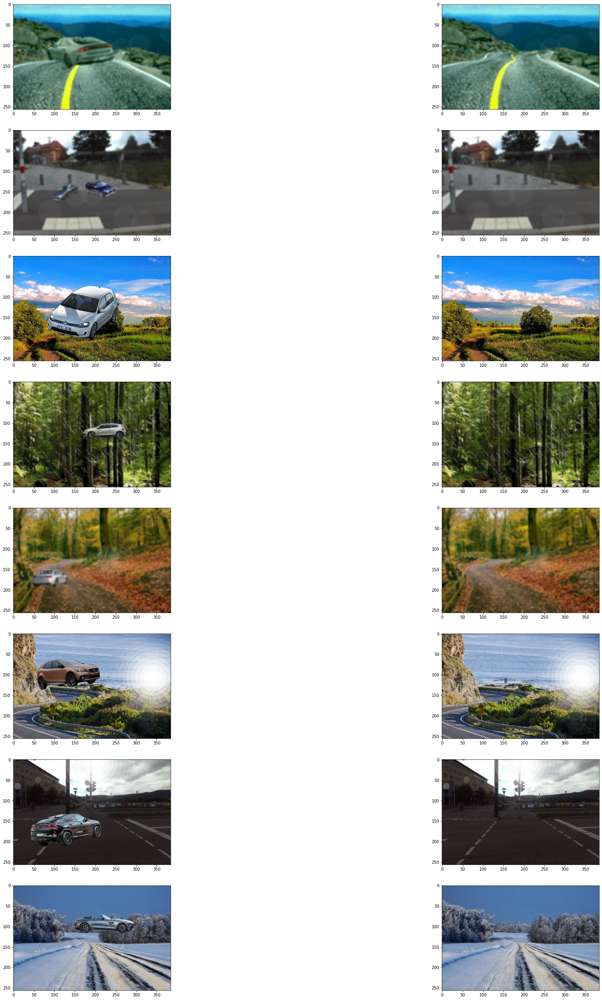

In [ ]:
x, y = image_paste_x_train()
fig, ax = plt.subplots(x.shape[0], 2, figsize=(35, 45))
for i in range(x.shape[0]):
    ax[i, 0].imshow(x[i])
    ax[i, 1].imshow(y[i])
    plt.show

In [ ]:
def visualize(image):
    plt.figure(figsize=(10, 10))
    plt.axis('off')
    plt.imshow(image)

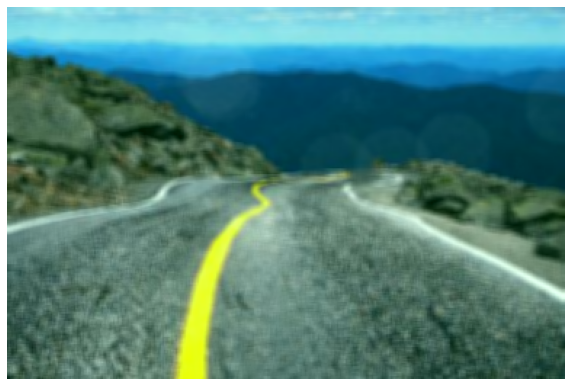

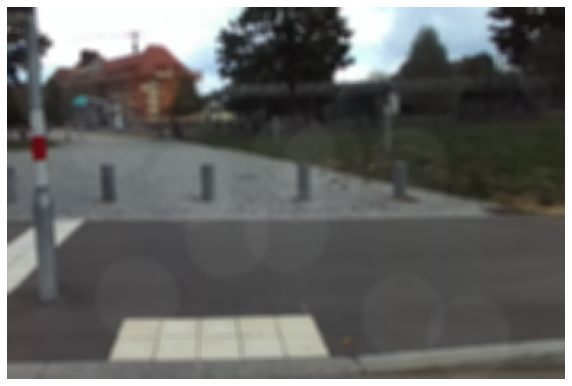

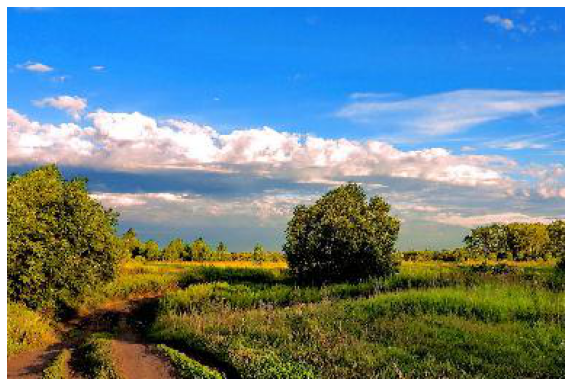

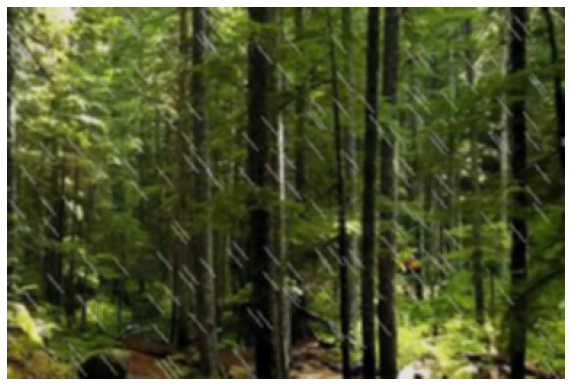

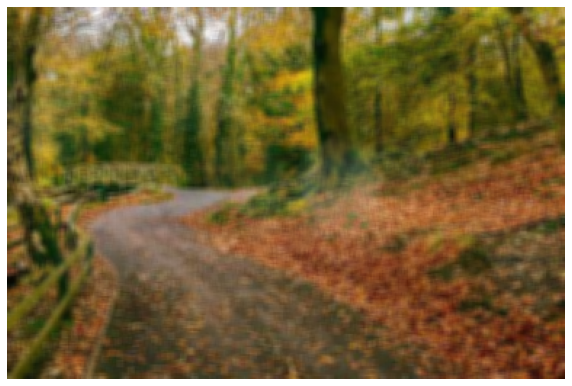

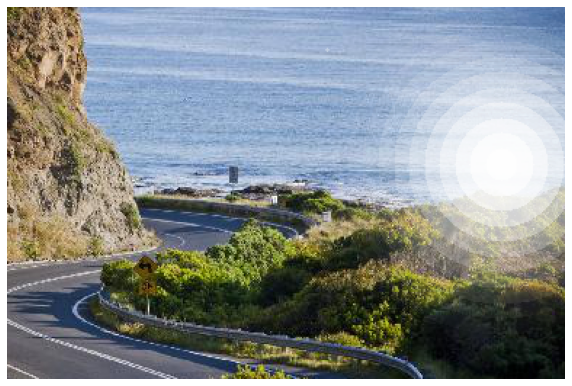

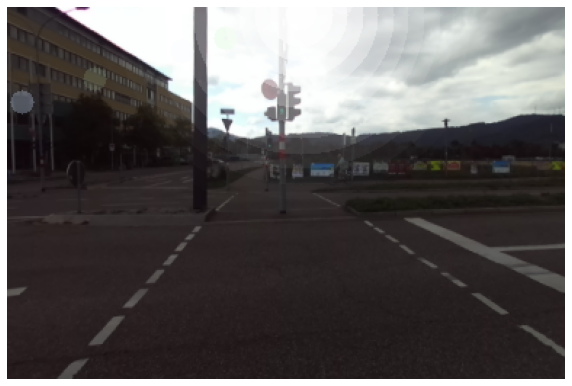

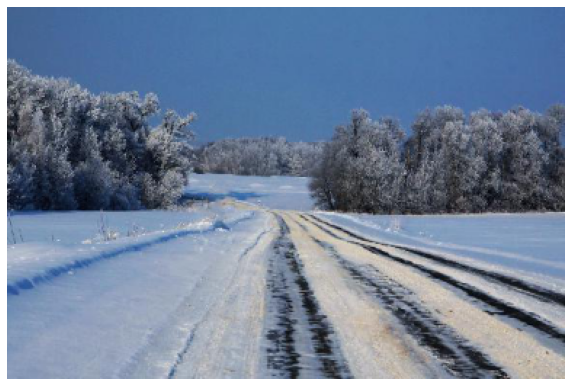

In [ ]:
for i in range(x.shape[0]):
  visualize(y[i])

**Генератор**

In [ ]:
img_shape = (256, 384, 3)  # размер изображения
height = img_shape[0]
width = img_shape[1]


def build_generator():
    filters = 32  # минимальное число фильтров

    def en_conv2d(layer_input, filters, k_size_1=4, k_size_2=4, strides=2, bn=True,
                  maxp=False):  # слой с понижением разрешения.
        '''
        layer_input - слой на вход.
        filters- количество фильтров
        k_size_1 - размер ядра свертки
        k_size_2 - размер ядра свертки
        strides - какой strides применять в слое Conv2D
        bn - BatchNormalization
        maxp - MaxPooling2D
        '''
        en = Conv2D(filters, kernel_size=k_size_1, strides=1, padding='same')(layer_input)
        en = LeakyReLU(alpha=0.2)(en)
        en = Conv2D(filters, kernel_size=k_size_2, strides=strides, padding='same')(en)
        en = LeakyReLU(alpha=0.2)(en)
        if bn:
            en = BatchNormalization(momentum=0.8)(en)
            if maxp:
                en = MaxPooling2D(2)(en)
        return en

    def de_conv2d(layer_input, skip_input, filters, k_size_1=4, k_size_2=4,
                  dropout_rate=0):  # слой с повышением разрешения
        '''
        layer_input - слой на вход
        skip_input -  предыдущий слой от слоя с понижением разрешения (conv2d)
        filters - количество фильтров
        k_size_1 - размер ядра свертки
        k_size_2 - размер ядра свертки
        dropout_rate - применять ли dropout
        '''
        de = UpSampling2D(size=2)(layer_input)  # увеличивам разрешение в 2 раза
        de = Conv2D(filters, kernel_size=k_size_2, strides=1, padding='same', activation='relu')(
            de)  # strides=1, padding='same',  поэтому разрешение сохраняется
        de = Conv2D(filters, kernel_size=k_size_1, strides=1, padding='same', activation='relu')(
            de)  # strides=1, padding='same',  поэтому разрешение сохраняется
        if dropout_rate:
            de = Dropout(dropout_rate)(de)
        de = BatchNormalization(momentum=0.8)(de)
        de = Concatenate()([de,
                            skip_input])  # соединяем skip-слой от conv2d (слой с понижением разрешения) и слой от deconv2d (слой с повышением разрешения)
        return de

    e0 = Input(shape=img_shape, name="condition")  # входное изображение (условие)

    # Ветка 1, где понижается разрешение
    e1 = en_conv2d(e0, filters, bn=False)
    e2 = en_conv2d(e1, filters * 2)
    e3 = en_conv2d(e2, filters * 4)  # чем меньше размер карт активаций
    e4 = en_conv2d(e3, filters * 8)  # тем больше должно быть фильтров в сверточном слое
    e5 = en_conv2d(e4, filters * 8)
    e6 = en_conv2d(e5, filters * 8)
    e7 = en_conv2d(e6, filters * 8)

    # Ветка 2, где понижается разрешение
    ee1 = en_conv2d(e0, filters, k_size_1=2, k_size_2=2, bn=False)
    ee2 = en_conv2d(ee1, filters * 2, k_size_1=2, k_size_2=2, strides=1, maxp=True)
    ee3 = en_conv2d(ee2, filters * 4, k_size_1=2, k_size_2=2, strides=1, maxp=True)  # чем меньше размер карт активаций
    ee4 = en_conv2d(ee3, filters * 8, k_size_1=2, k_size_2=2, strides=1,
                    maxp=True)  # тем больше должно быть фильтров в сверточном слое
    ee5 = en_conv2d(ee4, filters * 8, k_size_1=2, k_size_2=2, strides=1, maxp=True)
    ee6 = en_conv2d(ee5, filters * 8, k_size_1=2, k_size_2=2, strides=1, maxp=True)
    ee7 = en_conv2d(ee6, filters * 8, k_size_1=2, k_size_2=2, strides=1, maxp=True)

    e_cont = Concatenate()([e7, ee7])  # соединяю 2 слоя вместе (от ветки 1 и ветки 2)
    e_cont = Conv2D(filters * 8, kernel_size=4, strides=1, padding='same', activation='relu', name='d_cont')(
        e_cont)  # прохожусь ещё раз сверткой

    # Ветка 1 повышения разрешения
    d1 = de_conv2d(e_cont, e6, filters * 8)
    d2 = de_conv2d(d1, e5, filters * 8)
    d3 = de_conv2d(d2, e4, filters * 8)  # чем больше размер карт активаций
    d4 = de_conv2d(d3, e3, filters * 4)  # тем меньше должно быть фильтров в сверточном слое
    d5 = de_conv2d(d4, e2, filters * 2)
    d6 = de_conv2d(d5, e1, filters)

    # Ветка 2 повышения разрешения
    dd1 = de_conv2d(e_cont, ee6, filters * 8, k_size_1=2, k_size_2=2)
    dd2 = de_conv2d(dd1, ee5, filters * 8, k_size_1=2, k_size_2=2)
    dd3 = de_conv2d(dd2, ee4, filters * 8, k_size_1=2, k_size_2=2)  # чем больше размер карт активаций
    dd4 = de_conv2d(dd3, ee3, filters * 4, k_size_1=2, k_size_2=2)  # тем меньше должно быть фильтров в сверточном слое
    dd5 = de_conv2d(dd4, ee2, filters * 2, k_size_1=2, k_size_2=2)
    dd6 = de_conv2d(dd5, ee1, filters, k_size_1=2, k_size_2=2)

    d7 = UpSampling2D(size=2)(d6)
    output_img_1 = Conv2D(3, kernel_size=4, strides=1, padding='same', activation='tanh', name='output_img_1')(
        d7)  # для ветки 1 - UpSampling2D и Conv2D
    output_img_2 = Conv2DTranspose(3, kernel_size=2, strides=2, padding='same', activation='tanh', name='output_img_2')(
        dd6)  # для ветки 2 - Conv2DTranspose
    output_img_cont = Concatenate(name='output_img_cont')([output_img_1, output_img_2])  # соединяю вместе

    output = Conv2D(3, kernel_size=4, strides=1, padding='same', activation='tanh', name='Gen_output')(
        output_img_cont)  # интенсивность должна быть от -1 до 1, поэтому используем tanh

    return Model(e0, output, name="Generator")


In [ ]:
gen = build_generator()
gen.summary()

Model: "Generator"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 condition (InputLayer)         [(None, 256, 384, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_14 (Conv2D)             (None, 256, 384, 32  416         ['condition[0][0]']              
                                )                                                                 
                                                                                                  
 leaky_re_lu_14 (LeakyReLU)     (None, 256, 384, 32  0           ['conv2d_14[0][0]']              
                                )                                                         

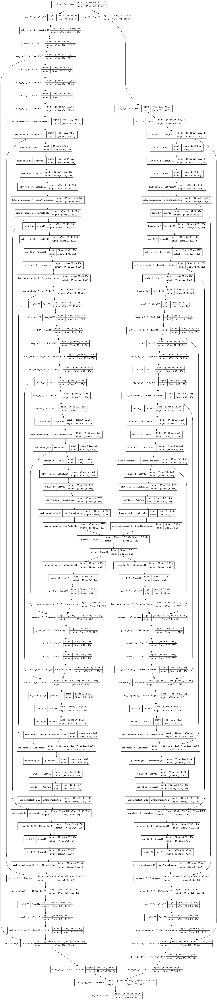

In [ ]:
plot_model(gen, '/content/drive/MyDrive/Модели/Ход обучения/Generator.png', show_shapes=True)

**Дискриминатор**

In [ ]:
def build_discriminator():
    filters = 32  # минимальное число фильтров

    def en_conv2d(layer_input, filters, k_size=4, bn=True):  # слой с понижением разрешения
        '''
        layer_input - слой на вход
        filters- количество фильтров
        k_size - размер ядра свертки
        bn - BatchNormalization
        '''

        en = Conv2D(filters, kernel_size=k_size, strides=2, padding='same')(
            layer_input)  # strides = 2 уменьшает разрешение в 2 раза при padding='same'
        en = LeakyReLU(alpha=0.2)(en)
        if bn:
            en = BatchNormalization(momentum=0.8)(en)
        return en

    def de_conv2d(layer_input, skip_input, filters, k_size=4,
                  dropout_rate=0):  # слой с повышением разрешения принимает на вход предыдущий слой и skip-слой 
        '''
        layer_input - слой на вход
        skip_input -  предыдущий слой от слоя с понижением разрешения (conv2d)
        filters - количество фильтров
        k_size - размер ядра свертки
        dropout_rate - применять ли dropout
        '''

        de = UpSampling2D(size=2)(layer_input)  # увеличивам разрешение в 2 раза
        de = Conv2D(filters, kernel_size=k_size, strides=1, padding='same', activation='relu')(
            de)  # strides=1, padding='same',  поэтому разрешение сохраняется
        if dropout_rate:
            de = Dropout(dropout_rate)(de)
        de = BatchNormalization(momentum=0.8)(de)
        de = Concatenate()([de,
                            skip_input])  # соединяем skip-слой от conv2d (слой с понижением разрешения) и слой от deconv2d (слой с повышением разрешения)
        return de

    image = Input(shape=img_shape,
                  name="real_or_fake_A")  # на вход дискриминатору подается либо реальное изображение, либо фейковое
    image_reference = Input(shape=img_shape,
                            name="Image_reference")  # и дополнительно изображение эталон - изображение без машины
    combined_imgs = Concatenate(axis=-1)([image, image_reference])  # объединяем оба входа в 1 слой

    # Ветка понижения разрешения, en_conv2d
    e1 = en_conv2d(combined_imgs, filters, bn=False)
    e2 = en_conv2d(e1, filters * 2)
    e3 = en_conv2d(e2, filters * 4)  # чем меньше размер карт активаций
    e4 = en_conv2d(e3, filters * 8)  # тем больше должно быть фильтров в сверточном слое
    # e5 = en_conv2d(e4, filters*8)
    # e6 = en_conv2d(e5, filters*8)
    # e7 = en_conv2d(e6, filters*8)

    # Ветка повышения разрешения, de_conv2d
    d1 = de_conv2d(e4, e3, filters * 8)
    d2 = de_conv2d(d1, e2, filters * 8)
    d3 = de_conv2d(d2, e1, filters * 8)  # чем больше размер карт активаций
    # d4 = de_conv2d(d3, e3, filters*4) #тем меньше должно быть фильтров в сверточном слое
    # d5 = de_conv2d(d4, e2, filters*2)
    # d6 = de_conv2d(d5, e1, filters)

    d7 = UpSampling2D(size=2)(d3)
    validity = Conv2D(1, kernel_size=4, strides=1, padding='same', activation='sigmoid', name='Dis_output')(
        d7)  # интенсивность должна быть от 0 до 1, поэтому используем sigmoid

    return Model([image, image_reference], validity, name='Discriminator')

In [ ]:
dis = build_discriminator()
dis.summary()

Model: "Discriminator"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 real_or_fake_A (InputLayer)    [(None, 256, 384, 3  0           []                               
                                )]                                                                
                                                                                                  
 Image_reference (InputLayer)   [(None, 256, 384, 3  0           []                               
                                )]                                                                
                                                                                                  
 concatenate_13 (Concatenate)   (None, 256, 384, 6)  0           ['real_or_fake_A[0][0]',         
                                                                  'Image_reference[0][

**Модель VGG**

In [ ]:
def build_vgg():
    # для feature loss создаем vgg модель
    vgg_in = Input(img_shape)
    vgg = vgg19.VGG19(include_top=False, input_shape=img_shape, input_tensor=vgg_in)  # скачиваем архитектуру и веса 
    vgg_out = vgg.get_layer('block5_conv4').output  # получаем последний сверточный слой
    vgg = Model(vgg_in, vgg_out, name='vgg')
    vgg.trainable = False  # модель уже предобучена, поэтому ее необходимо заморозить

    return vgg

In [ ]:
vgg = build_vgg()
vgg.summary()

Model: "vgg"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 384, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 256, 384, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 256, 384, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 128, 192, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 128, 192, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 128, 192, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 64, 96, 128)       0       

**Все модели вместе**

In [ ]:
def build_gan(discriminator, generator, vgg):
    discriminator.trainable = False  # замораживаем дискриминатор

    cars = Input(img_shape, name='Cars')  # вход изображения с машиной
    image_reference = Input(img_shape, name='Image_reference')  # вход изображения без машины
    fake_img = generator(cars)  # изображение, полученное от генератора

    fake_features = vgg(fake_img)  # карты активации, полученные от фейкового изображения

    fake_validity = discriminator([fake_img, image_reference])  # соединяем генератор и дискриминатор

    gan = Model([cars, image_reference], [fake_validity, fake_img, fake_features])

    return gan

In [ ]:
gan = build_gan(dis, gen, vgg)  # создаем gan

**Фукция для отображания результата**

In [ ]:
num_lin = 2  # количество строк для отображения


def imege_pred(generator, epoch, num_lin, x_tr, y_tr):
    img_width = 384
    img_height = 256

    fig, ax = plt.subplots(num_lin, 3, figsize=(25, 16))  # создаем сетку с num_lin строкой и 3 столбцами

    for i in range(num_lin):
        el = np.random.choice(x_tr.shape[0],
                              replace=False)  # Случайное число от 0 до 8 (количество элементов в x_train)

        image_result = x_tr[el]  # Беру случайную картинку авто на фоне
        background = y_tr[el]  # Беру фон

        condition = image_result / 127.5 - 1
        generated = (generator.predict(
            condition[None]) + 1) * 127.5  # делаю predict и обратно нормирую значения пикселей

        ax[i, 0].imshow(image_result)  # отображаю изображение авто на фоне
        ax[i, 0].set_title('До нейросети')

        ax[i, 1].imshow((generated[0].astype('uint8')))  # отображаю изображение predict 
        ax[i, 1].set_title('После нейросети')

        ax[i, 2].imshow(background)  # отображаю изображение фона 
        ax[i, 2].set_title('Первоначальный фон')

    plt.show()
    # if (epoch % 5 == 0):
    # fig.savefig("/content/drive/MyDrive/Модели/Ход обучения/Примеры/Эпоха_%d.jpg" % epoch) # Сохраняем изображения
    plt.close()  # Завершаем работу с plt

    # del x_tr # на всякий случай удаляю переменныую
    # del y_tr # на всякий случай удаляю переменныую
    # del image_result
    # del background
    # del generated

In [ ]:
'''
########################################!!!!!!!!!
# !!! ТОЛЬКО ПРИ ПЕРВОМ ЗАПУСКЕ или ИЗМЕНЕНИИ learning_rate!!!!

g_loss_list0 = [] # Массив значений ошибки генератора
g_loss_list1 = [] # Массив значений ошибки генератора
g_loss_list2 = [] # Массив значений ошибки генератора
g_loss_list3 = [] # Массив значений ошибки генератора
d_loss_list = []  # Массив значений ошибки дескриминатора
#d_acc_list = []   # Массив значений точности дескриминатора
# Сохраняю историю ошибок
np.save('/content/drive/MyDrive/Модели/Ход обучения/g_loss_list0', np.array(g_loss_list0))
np.save('/content/drive/MyDrive/Модели/Ход обучения/g_loss_list1', np.array(g_loss_list1))
np.save('/content/drive/MyDrive/Модели/Ход обучения/g_loss_list2', np.array(g_loss_list2))
np.save('/content/drive/MyDrive/Модели/Ход обучения/g_loss_list3', np.array(g_loss_list3))
np.save('/content/drive/MyDrive/Модели/Ход обучения/d_loss_list', np.array(d_loss_list))
#np.save('/content/drive/MyDrive/Модели/Ход обучения/d_loss_list', np.array(d_acc_list))

'''

**Функция обучения нейронной сети**

In [ ]:
batch_size = 8


def train(generator, discriminator, gan, vgg, epochs, batch_size):
    curTime = time.time()  # засекаю время  

    # загружаю листы с ошибками
    g_loss_list0 = list(
        np.load('/content/drive/MyDrive/Модели/Ход обучения/g_loss_list0.npy'))  # Массив значений ошибки генератора
    g_loss_list1 = list(
        np.load('/content/drive/MyDrive/Модели/Ход обучения/g_loss_list1.npy'))  # Массив значений ошибки генератора
    g_loss_list2 = list(
        np.load('/content/drive/MyDrive/Модели/Ход обучения/g_loss_list2.npy'))  # Массив значений ошибки генератора
    g_loss_list3 = list(
        np.load('/content/drive/MyDrive/Модели/Ход обучения/g_loss_list3.npy'))  # Массив значений ошибки генератора
    d_loss_list = list(
        np.load('/content/drive/MyDrive/Модели/Ход обучения/d_loss_list.npy'))  # Массив значений ошибки дескриминатора
    # d_acc_list = list(np.load('/content/drive/MyDrive/Модели/Ход обучения/d_acc_list.npy'))    # Массив значений точности дескриминатора

    for epoch in range(epochs):

        with tqdm(total=ln) as pbar:  # для отслеживания создаем progressbar
            for batch in range(ln // batch_size):
                # для тренировки дискриминатора применяем label smoothing (для борьбы с переобучением)
                # размерность Y: (размер батча, высота последнего слоя дискриминатора, ширина, 1)
                y_real = np.ones((batch_size, *discriminator.output_shape[1:])) - np.random.random_sample(
                    (batch_size, *discriminator.output_shape[1:])) * 0.2  # значения от 0.8 до 1
                y_fake = np.random.random_sample(
                    (batch_size, *discriminator.output_shape[1:])) * 0.2  # значения от 0 до 0.2

                x_tr, y_tr = image_paste_x_train()  # функция формирования x_train и y_train по батчам. Получаю numpy изображения размером batch_size.

                cars = (x_tr / 127.5) - 1  # изображения с машиной нормализую
                image_reference = (y_tr / 127.5) - 1  # изображения без машины нормализую

                fake_imgs = generator.predict(cars)  # удаляем машину генератором

                # тренируем дискриминатор       
                d_loss_real = discriminator.train_on_batch([image_reference, image_reference],
                                                           y_real)  # дискрминатор обучаю на реальных изображениях (чистый фон)
                d_loss_fake = discriminator.train_on_batch([fake_imgs, image_reference],
                                                           y_fake)  # дискриминатор обучаю на фэйковых изображениях (изображение после генератра)
                d_loss_total = 0.5 * np.add(d_loss_real, d_loss_fake)  # ошибка дискриминатора

                # тренируем генератор
                real_features = vgg.predict(
                    image_reference)  # с помощью vgg19 получаю фичи от изображенияй чистого фона 
                y_real = np.ones(
                    (batch_size, *discriminator.output_shape[1:]))  # y_true для дискриминатора в общей модели gan

                g_loss = gan.train_on_batch([cars, image_reference],
                                            [y_real, image_reference, real_features])  # обучаю gan

                g_loss_list0.append(g_loss[0])  # Добавляем в массив значений ошибок генератора g_loss
                g_loss_list1.append(g_loss[1])  # Добавляем в массив значений ошибок генератора g_loss
                g_loss_list2.append(g_loss[2])  # Добавляем в массив значений ошибок генератора g_loss
                g_loss_list3.append(g_loss[3])  # Добавляем в массив значений ошибок генератора g_loss
                d_loss_list.append(d_loss_total[0])  # Добавляем в массив значений ошибок дискриминатора
                # d_acc_list.append(d_loss_total[1]) # Добавляем в массив значений точности дискриминатора
                pbar.update(batch_size)  # обновляем progressbar
                pbar.set_description("Epoch: {}/{}, Acc: {} %, Dis loss: {}, Gen loss:{}".format(epoch + 1, epochs,
                                                                                                 100 * d_loss_total[1],
                                                                                                 d_loss_total[0],
                                                                                                 g_loss))

        # каждые 3 эпохи вывожу результат
        if ((epoch % 3 == 0) | (epoch == epochs - 1)):
            imege_pred(generator, epoch, 2, x_tr, y_tr)  # отображаю результат, 2 строки

            plt.figure(figsize=(20, 20))
            plt.subplot(3, 2, 1)
            plt.plot(g_loss_list0, label="Ошибка 0")
            plt.legend()
            plt.subplot(3, 2, 2)
            plt.plot(g_loss_list1, label="Ошибка 1")
            plt.legend()
            plt.subplot(3, 2, 3)
            plt.plot(g_loss_list2, label="Ошибка 2")
            plt.legend()
            plt.subplot(3, 2, 4)
            plt.plot(g_loss_list3, label="Ошибка 3")
            plt.legend()
            plt.subplot(3, 2, 5)
            plt.plot(d_loss_list, label="Ошибка дискриминатора")
            plt.legend()
            # plt.subplot(3, 2, 6)
            # plt.plot(d_acc_list, label="Точность дискриминатора")
            # plt.legend()
            plt.savefig('/content/drive/MyDrive/Модели/Ход обучения/Графики ошибок_lr_1e-5_LW_1_200_100.png',
                        dpi=100)  # сохраняю графики
            plt.show()
            plt.close()  # Завершаем работу с plt

        # Сохраняю модель генератора, дискриминатора и весь gan
        gen.save('/content/drive/MyDrive/Модели/Gen_7_256_384.h5')
        dis.save('/content/drive/MyDrive/Модели/Dis_7_256_384.h5')
        # gan.save('/content/drive/MyDrive/Модели/GAN_7_256_384.h5')

        # Сохраняю историю ошибок
        np.save('/content/drive/MyDrive/Модели/Ход обучения/g_loss_list0', np.array(g_loss_list0))
        np.save('/content/drive/MyDrive/Модели/Ход обучения/g_loss_list1', np.array(g_loss_list1))
        np.save('/content/drive/MyDrive/Модели/Ход обучения/g_loss_list2', np.array(g_loss_list2))
        np.save('/content/drive/MyDrive/Модели/Ход обучения/g_loss_list3', np.array(g_loss_list3))
        np.save('/content/drive/MyDrive/Модели/Ход обучения/d_loss_list', np.array(d_loss_list))
        # np.save('/content/drive/MyDrive/Модели/Ход обучения/d_acc_list', np.array(d_acc_list))

        print('GAN осохранена на {} эпохе. Время от старта: {} мин. {} сек.'.format(epoch, round(
            ((time.time() - curTime) // 60)), round((time.time() - curTime) % 60)))
    print('Время работы: {} мин. {} сек.'.format(round(((time.time() - curTime) // 60)),
                                                 round((time.time() - curTime) % 60)))


**Запускаю GAN**


In [ ]:
#13 эпох,   минуты, Dis learning_rate=1e-4, GAN learning_rate=1e-4, loss_weights=[1,200,100]

In [ ]:
#28  эпох, 239 минуты, Dis learning_rate=1e-4, GAN learning_rate=1e-4, loss_weights=[1,200,100]

In [ ]:
#28 эпох,  247 минуты, Dis learning_rate=1e-4, GAN learning_rate=1e-4, loss_weights=[1,200,100]

In [ ]:
#30 эпох,  264 минуты, Dis learning_rate=1e-4, GAN learning_rate=1e-4, loss_weights=[1,200,100]

In [ ]:
#26 эпох,  233 минуты, Dis learning_rate=1e-4, GAN learning_rate=1e-4, loss_weights=[1,200,100]

In [ ]:
#27 эпох,  240 минуты, Dis learning_rate=1e-4, GAN learning_rate=1e-4, loss_weights=[1,200,100]

In [ ]:
#27 эпох,  243 минуты, Dis learning_rate=1e-4, GAN learning_rate=1e-4, loss_weights=[1,200,100]

In [ ]:
#26 эпох,  237 минуты, Dis learning_rate=1e-4, GAN learning_rate=1e-4, loss_weights=[1,200,100]

In [ ]:
#26 эпох,  234 минуты, Dis learning_rate=1e-4, GAN learning_rate=1e-4, loss_weights=[1,200,100]

**Добавил в базу фонов около 1000 фото. Итого 2528 фонов.**

In [ ]:
#13 эпох,   200 минуты, Dis learning_rate=1e-4, GAN learning_rate=1e-4, loss_weights=[1,200,100]

In [ ]:
#16 эпох,   245 минуты, Dis learning_rate=1e-4, GAN learning_rate=1e-4, loss_weights=[1,200,100]

In [ ]:
#13 эпох,    201 минута, Dis learning_rate=1e-4, GAN learning_rate=1e-4, loss_weights=[1,200,100]

In [ ]:
#20 эпох,    315 минуты, Dis learning_rate=1e-4, GAN learning_rate=1e-4, loss_weights=[1,200,100]

In [ ]:
#16 эпох,     252 минуты, Dis learning_rate=1e-4, GAN learning_rate=1e-4, loss_weights=[1,200,100]

In [ ]:
#15 эпох,     229 минуты, Dis learning_rate=1e-4, GAN learning_rate=1e-4, loss_weights=[1,200,100]

In [ ]:
#16 эпох,     249 минуты, Dis learning_rate=1e-4, GAN learning_rate=1e-4, loss_weights=[1,200,100]

In [ ]:
#15 эпох,      232 минуты, Dis learning_rate=1e-4, GAN learning_rate=1e-4, loss_weights=[1,200,100]

**loss_weights=[1, 100, 10]**

In [ ]:
#15 эпох,       230 минуты, Dis learning_rate=1e-4, GAN learning_rate=1e-4, loss_weights=[1,100,10]

In [ ]:
#16 эпох,       244 минуты, Dis learning_rate=1e-4, GAN learning_rate=1e-4, loss_weights=[1,100,10]

In [ ]:
#15 эпох,       231 минуты, Dis learning_rate=1e-4, GAN learning_rate=1e-4, loss_weights=[1,100,10]

In [ ]:
#15 эпох,      232 минуты, Dis learning_rate=1e-4, GAN learning_rate=1e-4, loss_weights=[1,100,10]

In [ ]:
#17 эпох,      272 минуты, Dis learning_rate=1e-4, GAN learning_rate=1e-4, loss_weights=[1,100,10]

In [ ]:
#16 эпох,      257 минуты, Dis learning_rate=1e-4, GAN learning_rate=1e-4, loss_weights=[1,100,10]

**Случайно поставил** Dis learning_rate=**1e-3**,  GAN learning_rate=**1e-3**, loss_weights=[1, 200, 100],

In [ ]:
# 1 эпох,       15 минуты, Dis learning_rate=1e-4, GAN learning_rate=1e-4, loss_weights=[1,200,100]

**Вернул** Dis learning_rate=**1e-4**, GAN learning_rate=**1e-4**, loss_weights=[1, 100, 10],

In [ ]:
#14 эпох ,        228 минуты, Dis learning_rate=1e-4, GAN learning_rate=1e-4, loss_weights=[1,100,10]

**Dis l_r=1e-5, GAN l_r=1e-5, loss_weights=[1, 200,100]**

In [ ]:
#18 эпох ,        308 минуты, Dis learning_rate=1e-5, GAN learning_rate=1e-5, loss_weights=[1,200,10]

In [ ]:
#16 эпох ,        248 минуты, Dis learning_rate=1e-5, GAN learning_rate=1e-5, loss_weights=[1,200,10]

In [ ]:
#16 эпох ,        249 минуты, Dis learning_rate=1e-5, GAN learning_rate=1e-5, loss_weights=[1,200,10]

In [ ]:
#11 эпох ,        176 минуты, Dis learning_rate=1e-5, GAN learning_rate=1e-5, loss_weights=[1,200,10]

In [ ]:
'''
gen = build_generator() #создаем генератор

dis = build_discriminator() #создаем дискриминатор
dis.compile(loss='binary_crossentropy', optimizer=Adam(learning_rate=1e-4, beta_1=0.5), metrics=['accuracy'])

vgg = build_vgg() #создаем vgg модель

gan = build_gan(dis, gen, vgg) #создаем gan
gan.compile(loss=['binary_crossentropy', 'mse', 'mse'], loss_weights=[1,200,100], optimizer=Adam(learning_rate=1e-4, beta_1=0.5)) #вклад разницы между пикселями в 200 раз больше и в feature loss в 100 раз больше, чем вклад от GAN.
'''

In [ ]:
# Загружаю модель gen и dis
gen = load_model('/content/drive/MyDrive/Модели/Gen_7_256_384.h5')
dis = load_model('/content/drive/MyDrive/Модели/Dis_7_256_384.h5')

# компилирую dis
dis.compile(loss='binary_crossentropy', optimizer=Adam(learning_rate=1e-5, beta_1=0.5), metrics=['accuracy'])

# создаю vgg модель
vgg = build_vgg()
# создаем gan из vgg и загруженных из gogle drive генератора и дискриминатора
gan = build_gan(dis, gen, vgg)

# компилирую gan
gan.compile(loss=['binary_crossentropy', 'mse', 'mse'], loss_weights=[1, 200, 100],
            optimizer=Adam(learning_rate=1e-5, beta_1=0.5))

  0%|          | 0/2528 [00:00<?, ?it/s]/usr/local/lib/python3.7/dist-packages/albumentations/core/transforms_interface.py:93: UserWarning: RandomFog could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  self.get_class_fullname() + " could work incorrectly in ReplayMode for other input data"
/usr/local/lib/python3.7/dist-packages/albumentations/core/transforms_interface.py:93: UserWarning: RandomRain could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  self.get_class_fullname() + " could work incorrectly in ReplayMode for other input data"
/usr/local/lib/python3.7/dist-packages/albumentations/core/transforms_interface.py:93: UserWarning: RandomSunFlare could work incorrectly in ReplayMode for other input data because its' params depend on targets.
  self.get_class_fullname() + " could work incorrectly in ReplayMode for other input data"
/usr/local/lib/python3.7/dist-packages/albumentations/core/t

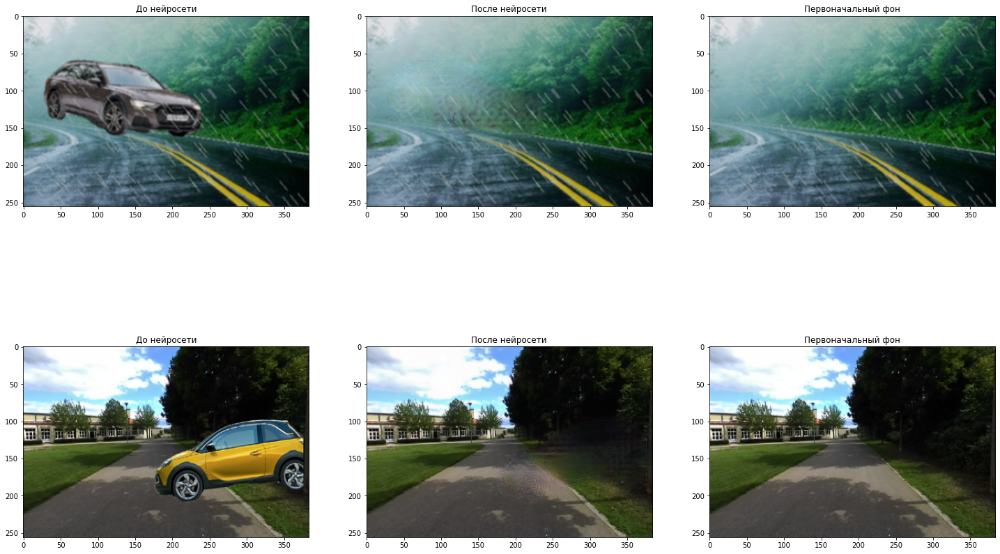

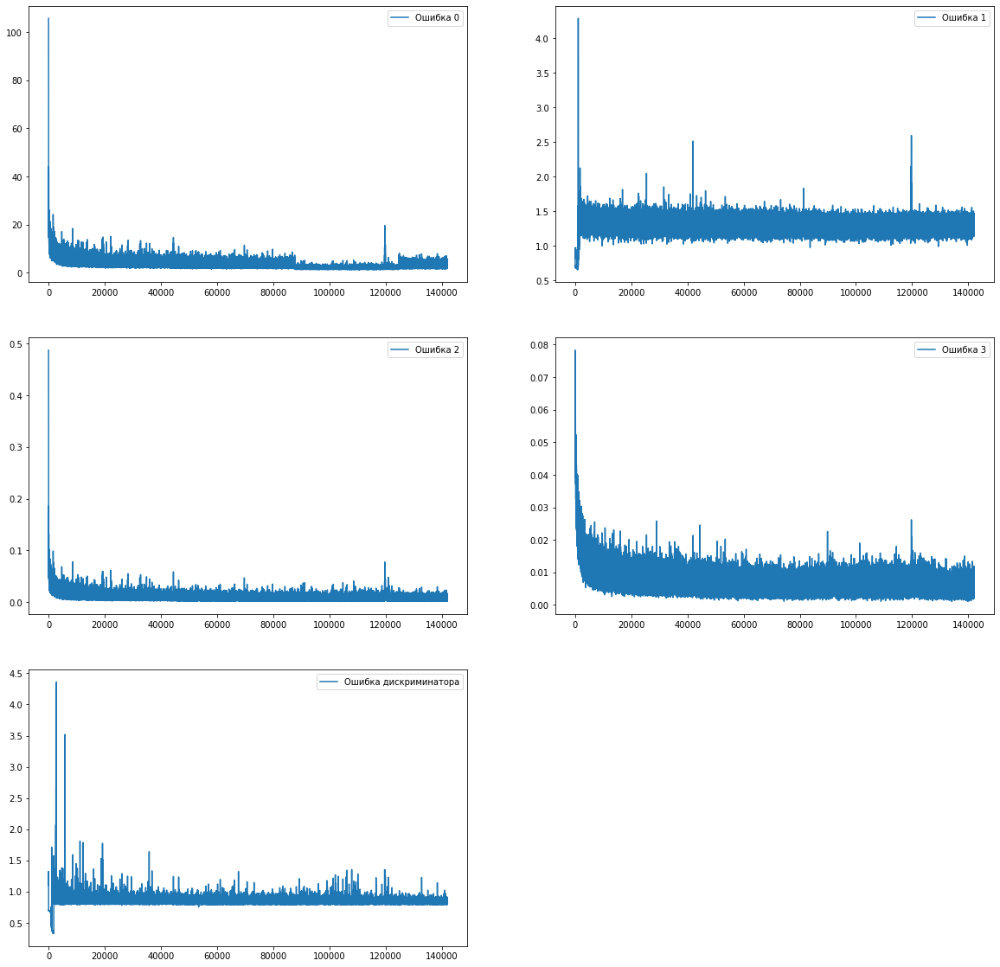

GAN осохранена на 0 эпохе. Время от старта: 15 мин. 21 сек.


Epoch: 2/50, Acc: 0.0 %, Dis loss: 0.8768313229084015, Gen loss:[4.199305534362793, 1.3870010375976562, 0.01021568849682808, 0.00769166462123394]: 100%|██████████| 2528/2528 [14:29<00:00,  2.91it/s]


GAN осохранена на 1 эпохе. Время от старта: 29 мин. 54 сек.


Epoch: 3/50, Acc: 0.0 %, Dis loss: 0.8480262458324432, Gen loss:[3.106741189956665, 1.2550439834594727, 0.006917573977261782, 0.004681823775172234]: 100%|██████████| 2528/2528 [14:31<00:00,  2.90it/s]


GAN осохранена на 2 эпохе. Время от старта: 44 мин. 30 сек.


Epoch: 4/50, Acc: 0.0 %, Dis loss: 0.8414155542850494, Gen loss:[2.3307085037231445, 1.1820473670959473, 0.004291771911084652, 0.0029030677396804094]: 100%|██████████| 2528/2528 [14:32<00:00,  2.90it/s]


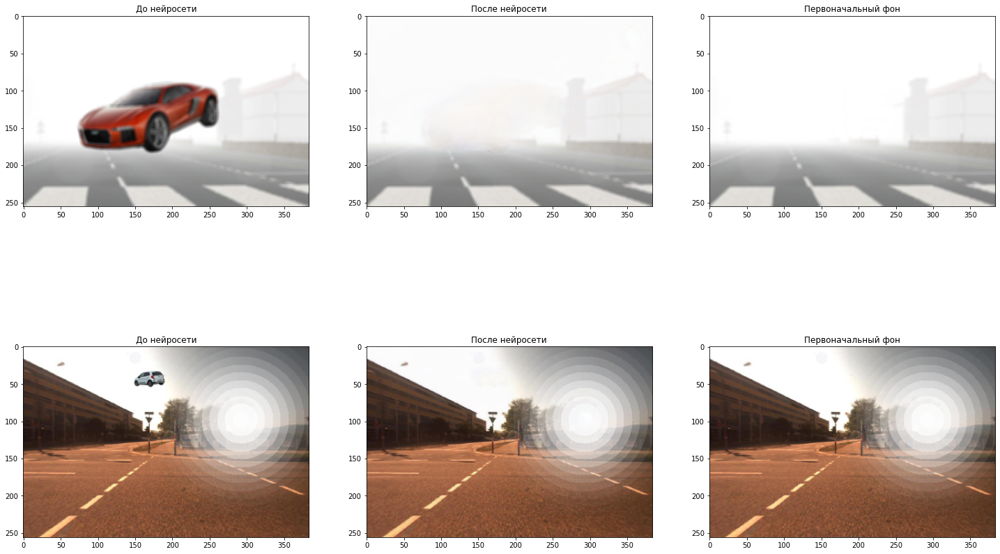

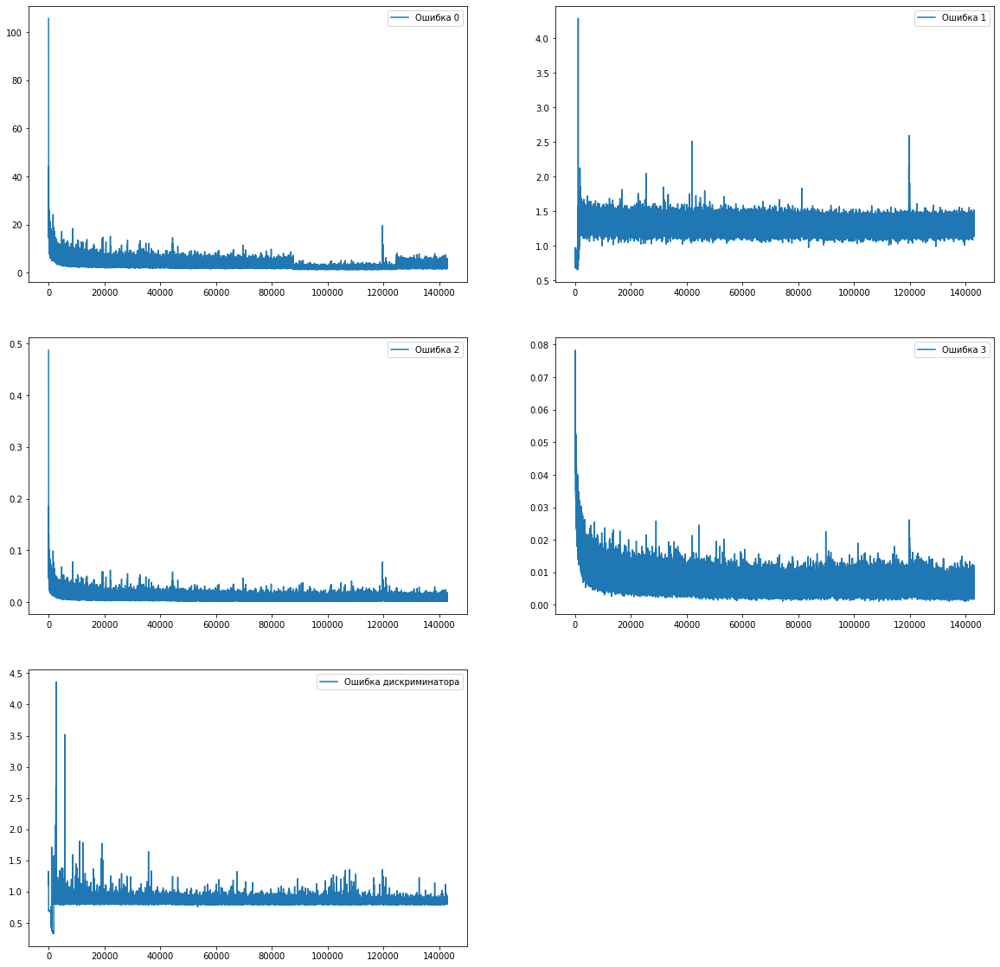

GAN осохранена на 3 эпохе. Время от старта: 59 мин. 9 сек.


Epoch: 5/50, Acc: 0.0 %, Dis loss: 0.8488320708274841, Gen loss:[2.6432340145111084, 1.2718816995620728, 0.004421277437359095, 0.004870968405157328]: 100%|██████████| 2528/2528 [14:32<00:00,  2.90it/s]


GAN осохранена на 4 эпохе. Время от старта: 73 мин. 46 сек.


Epoch: 6/50, Acc: 0.0 %, Dis loss: 0.8350014388561249, Gen loss:[2.9665615558624268, 1.3396166563034058, 0.006127201486378908, 0.00401504710316658]: 100%|██████████| 2528/2528 [14:31<00:00,  2.90it/s]


GAN осохранена на 5 эпохе. Время от старта: 88 мин. 20 сек.


Epoch: 7/50, Acc: 0.0 %, Dis loss: 0.8209333717823029, Gen loss:[2.9801628589630127, 1.3368793725967407, 0.005383886396884918, 0.005665060598403215]: 100%|██████████| 2528/2528 [14:32<00:00,  2.90it/s]


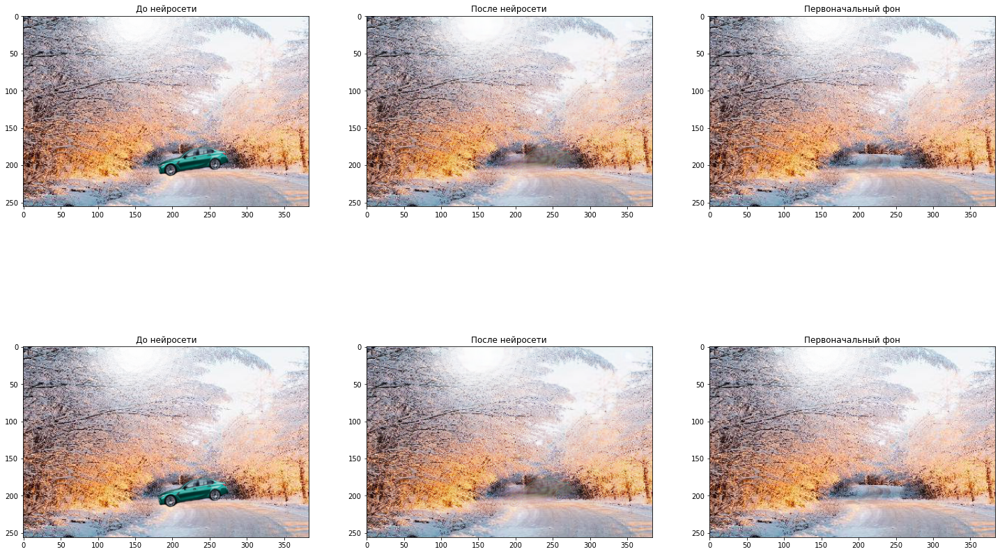

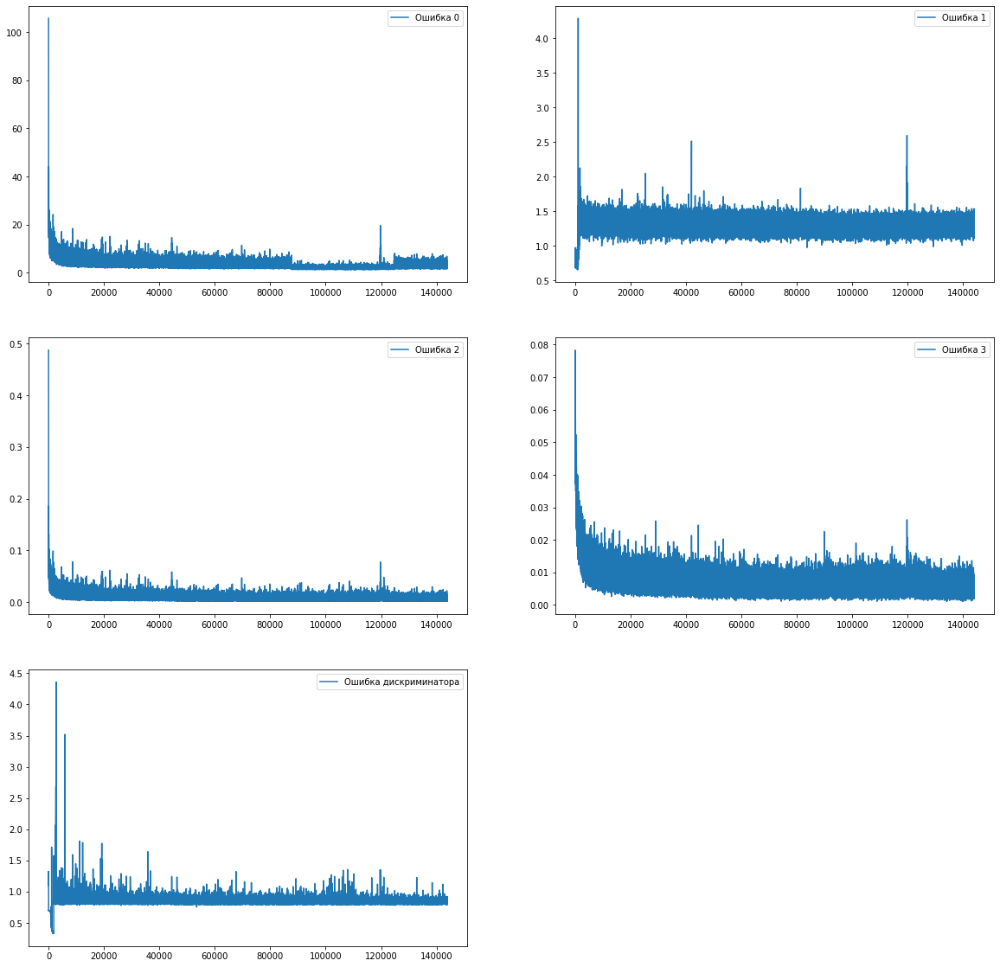

GAN осохранена на 6 эпохе. Время от старта: 102 мин. 59 сек.


Epoch: 8/50, Acc: 0.0 %, Dis loss: 0.8269390016794205, Gen loss:[1.91773521900177, 1.2808914184570312, 0.0016567051643505692, 0.0030550279188901186]: 100%|██████████| 2528/2528 [14:33<00:00,  2.89it/s]


GAN осохранена на 7 эпохе. Время от старта: 117 мин. 35 сек.


Epoch: 9/50, Acc: 0.0 %, Dis loss: 0.8264641463756561, Gen loss:[3.440791130065918, 1.4217814207077026, 0.006646736990660429, 0.006896624341607094]: 100%|██████████| 2528/2528 [14:33<00:00,  2.89it/s]


GAN осохранена на 8 эпохе. Время от старта: 132 мин. 11 сек.


Epoch: 10/50, Acc: 0.0 %, Dis loss: 0.8392049074172974, Gen loss:[4.078375339508057, 1.232849359512329, 0.011107205413281918, 0.006240850780159235]: 100%|██████████| 2528/2528 [14:33<00:00,  2.89it/s]


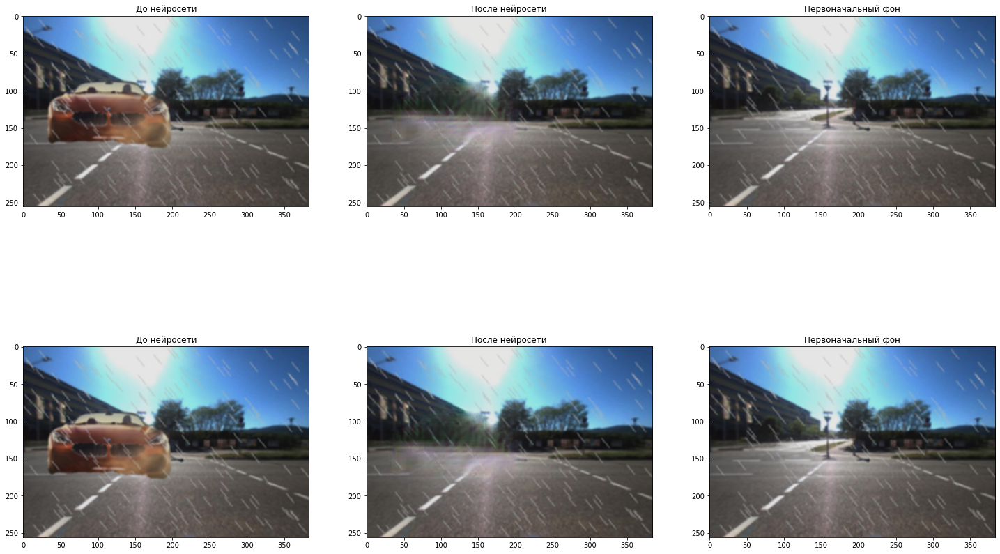

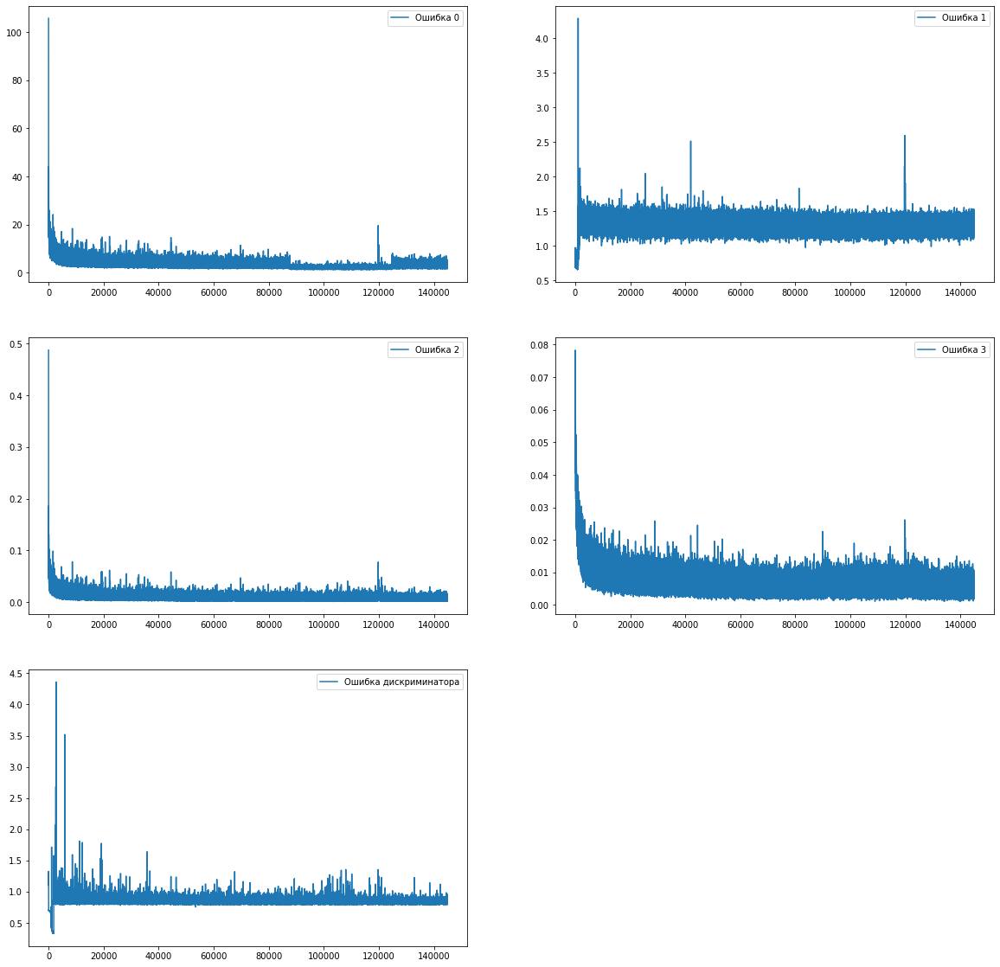

GAN осохранена на 9 эпохе. Время от старта: 146 мин. 51 сек.


Epoch: 11/50, Acc: 0.0 %, Dis loss: 0.8154412060976028, Gen loss:[2.0350182056427, 1.2921578884124756, 0.0020647915080189705, 0.0032990213949233294]: 100%|██████████| 2528/2528 [14:34<00:00,  2.89it/s]


GAN осохранена на 10 эпохе. Время от старта: 161 мин. 28 сек.


Epoch: 12/50, Acc: 0.0 %, Dis loss: 0.8187588155269623, Gen loss:[4.34005069732666, 1.336086392402649, 0.010599455796182156, 0.00884073507040739]: 100%|██████████| 2528/2528 [14:36<00:00,  2.88it/s]


GAN осохранена на 11 эпохе. Время от старта: 176 мин. 7 сек.


Epoch: 13/50, Acc: 0.0 %, Dis loss: 0.8430573642253876, Gen loss:[3.315019130706787, 1.3188434839248657, 0.00693472707644105, 0.006092302966862917]: 100%|██████████| 2528/2528 [14:36<00:00,  2.88it/s]


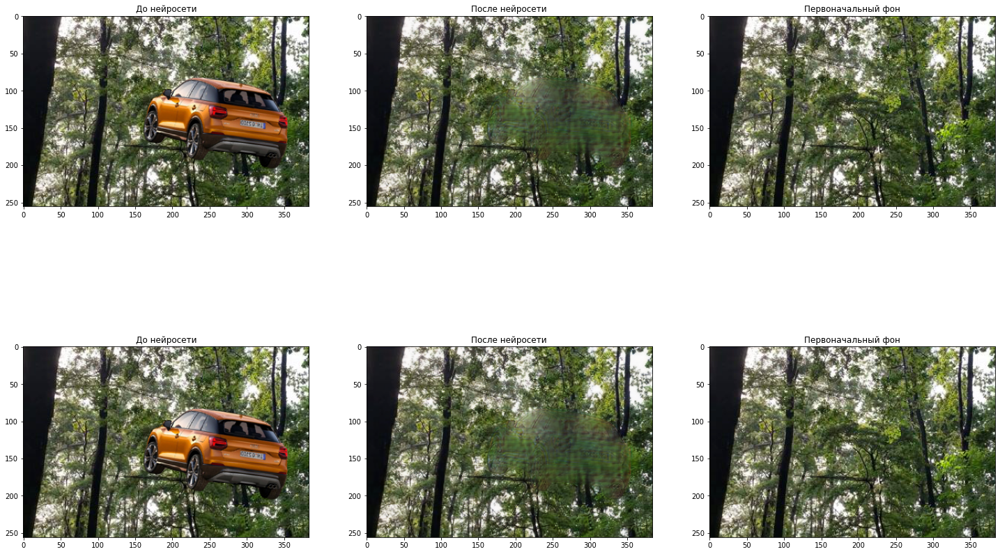

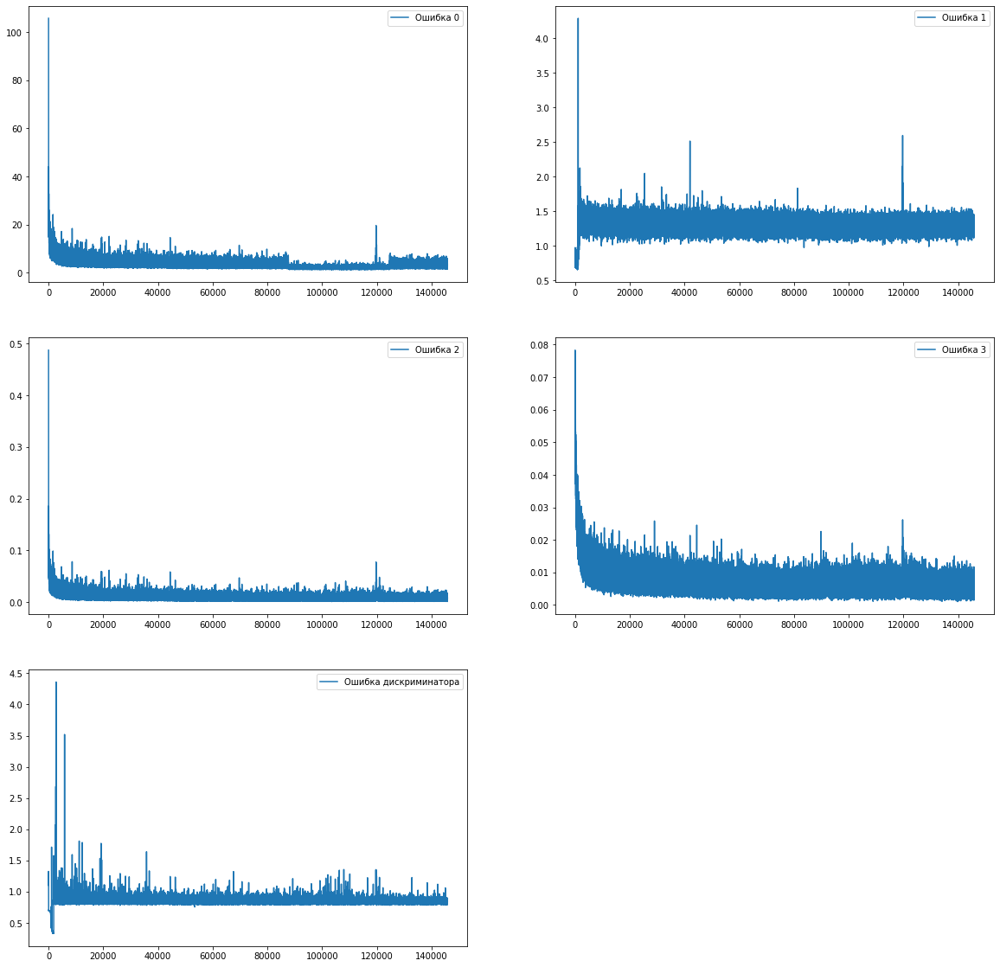

GAN осохранена на 12 эпохе. Время от старта: 190 мин. 51 сек.


Epoch: 14/50, Acc: 0.0 %, Dis loss: 0.8400872498750687, Gen loss:[4.2563796043396, 1.471676230430603, 0.009729910641908646, 0.00838721264153719]:   4%|▍         | 112/2528 [00:40<14:31,  2.77it/s]


KeyboardInterrupt: ignored

In [ ]:
batch_size = 8
train(gen, dis, gan, vgg, 50, batch_size)  # тренируем модель

**ИТОГО**

**Сумарно 525 эпох обучения, 6670 минут= 111 часов = 4,6 дня**

**Оценка результата**

In [ ]:
# для визуализации
def visualize(image):
    plt.figure(figsize=(10, 10))
    plt.axis('off')
    plt.imshow(image)


# rpedict и отображение результата
def pred_img(way_img):
    'way -  путь к изображению'
    car1 = image.load_img(way_img, target_size=(256, 384))  # загрузка изображения
    car = np.array(car1)  # numpy
    car = car / 127.5 - 1  # нормализую
    image_pred = gen.predict(car[None])  # проверка predict на модели gen 
    image_pred = (image_pred[0] + 1) * 127.5  # нормализую
    image_pred = image_pred.astype('uint8')  # меняю тип на целочисленный
    visualize(car1)  # отображаю с пом. функции visualize
    visualize(image_pred)

In [ ]:
# загружаю генератор
gen = load_model('/content/drive/MyDrive/Модели/Gen_7_256_384.h5')

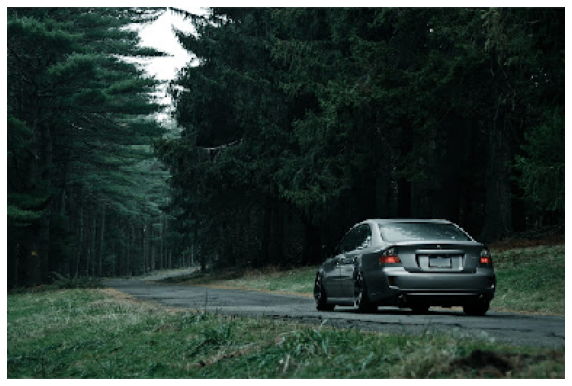

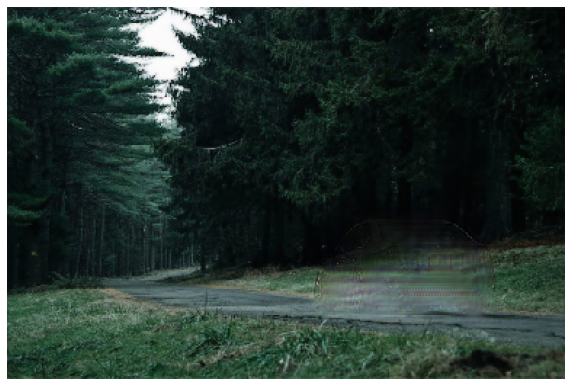

In [ ]:
way_img = '/content/1.jpg'
pred_img(way_img)

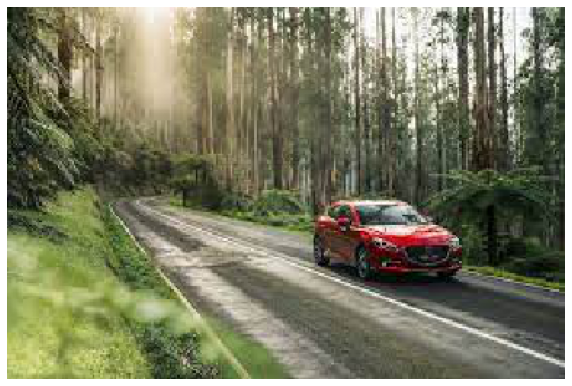

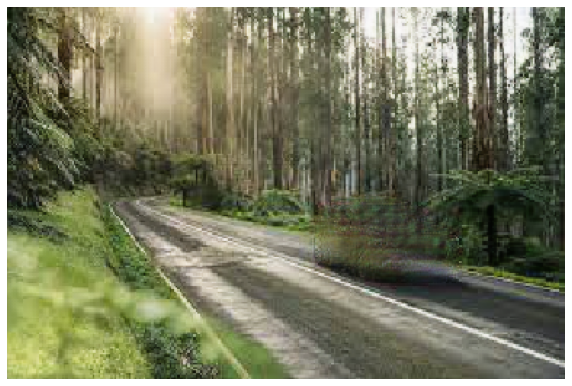

In [ ]:
way_img = '/content/2.jpg'
pred_img(way_img)

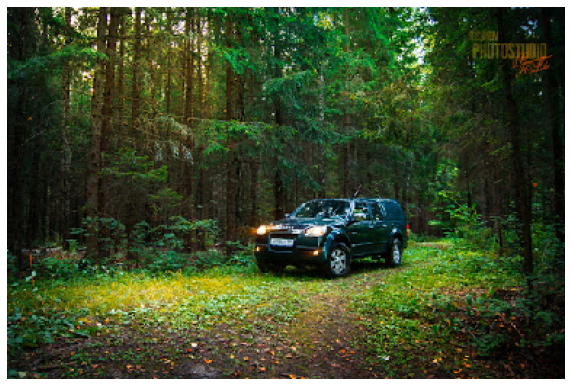

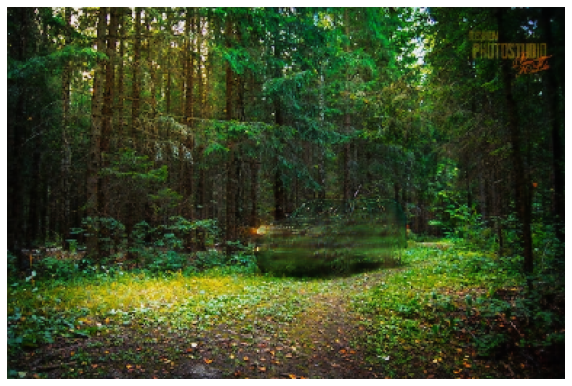

In [ ]:
way_img = '/content/3.jpg'
pred_img(way_img)

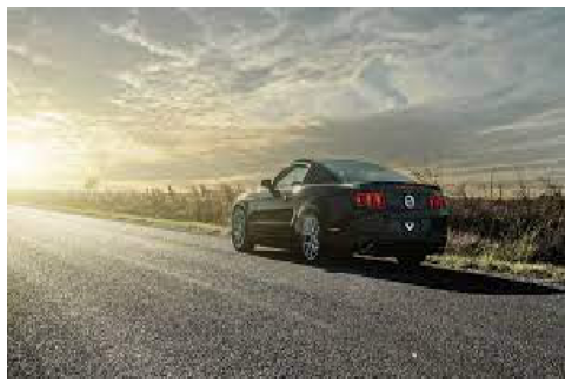

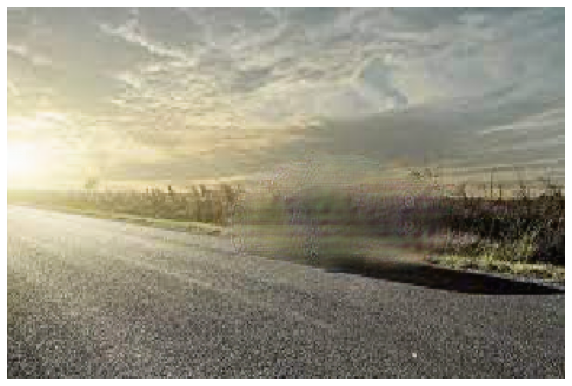

In [ ]:
way_img = '/content/4.jpg'
pred_img(way_img)